# BigGAN - Geração de imagens de categorias específicas

**BigGAN** (paper: [Large Scale GAN Training for High Fidelity Natural Image Synthesis](https://arxiv.org/abs/1809.11096))

A BigGAN é uma rede generativa adversa (GAN) que conseguiu estabelecer novos níveis de qualidade e resolução na geração de imagens. Algumas de suas principais características:

- Utiliza escala significativamente maior do que GANs anteriores, com mais parâmetros e dados de treinamento. Daí o nome "BigGAN".

- Treinada no conjunto de dados ImageNet com 1.2 milhão de imagens e 1000 classes diferentes de objetos. 

- Consegue gerar imagens de alta resolução de 256x256 pixels com nível sem precedentes de variedade e fidelidade.

- Introduz técnicas como BatchNorm condicional e truncamento para melhorar a qualidade e variedade das amostras geradas.

- Pode gerar imagens realisticamente complexas condicionadas a diferentes classes de ImageNet que vão desde animais, veículos e móveis até alimentos, plantas e outros objetos.

- Estabeleceu novos recordes de pontuação em medidas padrão de avaliação de GANs como Inception Score e Fréchet Inception Distance.

- Abriu caminho para pesquisas subsequentes em GANs de larga escala para geração de conteúdo.

Em resumo, a BigGAN demonstrou impressionantes melhorias em qualidade e resolução de imagens geradas por GANs graças ao seu tamanho maciço e conjunto de dados, técnicas avançadas e poder computacional.

Essa rede demonstrou conseguir resultados *estado-da-arte*, gerando imagens de alta qualidade para modelos treinados com datasets muito grandes e com muitas categorias/classes distintas, como é o caso do **ImageNet** por exemplo.

Usaremos o [Tensorflow Hub](https://www.tensorflow.org/hub?hl=pt-br).

## Importação das bibliotecas

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import tensorflow_hub as hub
import os
import io
import numpy as np
import PIL.Image
import json
import cv2

Instructions for updating:
non-resource variables are not supported in the long term


## Modelo pré-treinado

O Tensorflow Hub oferece alguns modelos para o BigGAN, você pode ver todos aqui:
* https://tfhub.dev/s?publisher=deepmind&q=biggan

Em nosso exemplo, usaremos o modelo [biggan-deep-256](https://tfhub.dev/deepmind/biggan-deep-256/1), que foi treinado com imagens do ImageNet no tamanho 256x256 pixels.

> O link para esse modelo é: https://tfhub.dev/deepmind/biggan-deep-256/1


### Configuração do módulo do gerador

In [ ]:
caminho_modelo = 'https://tfhub.dev/deepmind/biggan-deep-256/1'

In [ ]:
tf.reset_default_graph()
modulo = hub.Module(caminho_modelo)
print('Caminho do modelo:', caminho_modelo)

Caminho do modelo: https://tfhub.dev/deepmind/biggan-deep-256/1


In [ ]:
modulo.get_input_info_dict()

{'z': <hub.ParsedTensorInfo shape=(?, 128) dtype=float32 is_sparse=False>,
 'y': <hub.ParsedTensorInfo shape=(?, 1000) dtype=float32 is_sparse=False>,
 'truncation': <hub.ParsedTensorInfo shape=() dtype=float32 is_sparse=False>}

In [ ]:
modulo.get_input_info_dict().items()

dict_items([('z', <hub.ParsedTensorInfo shape=(?, 128) dtype=float32 is_sparse=False>), ('y', <hub.ParsedTensorInfo shape=(?, 1000) dtype=float32 is_sparse=False>), ('truncation', <hub.ParsedTensorInfo shape=() dtype=float32 is_sparse=False>)])

In [ ]:
inputs = {k: tf.placeholder(v.dtype, v.get_shape().as_list(), k)
          for k, v in modulo.get_input_info_dict().items()}
inputs

{'z': <tf.Tensor 'z:0' shape=(?, 128) dtype=float32>,
 'y': <tf.Tensor 'y:0' shape=(?, 1000) dtype=float32>,
 'truncation': <tf.Tensor 'truncation:0' shape=() dtype=float32>}

In [ ]:
output = modulo(inputs)
print(output)

Tensor("module_apply_default/G_trunc_output:0", shape=(?, 256, 256, 3), dtype=float32)


## Carregamento das categorias

In [ ]:
!gdown 1xnpKagUd2zh05vVFAC9XtiMrCOfX9SsI

Downloading...
From: https://drive.google.com/uc?id=1xnpKagUd2zh05vVFAC9XtiMrCOfX9SsI
To: /content/categorias_biggan.json
100% 29.7k/29.7k [00:00<00:00, 36.8MB/s]


In [ ]:
f = open('/content/categorias_biggan.json')
dados = json.load(f)

In [ ]:
lista_categorias = {}
for i, categ in enumerate(dados):
  lista_categorias[i] = categ

In [ ]:
lista_categorias

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

## Funções para processamento e exibição

In [ ]:
inputs

{'z': <tf.Tensor 'z:0' shape=(?, 128) dtype=float32>,
 'y': <tf.Tensor 'y:0' shape=(?, 1000) dtype=float32>,
 'truncation': <tf.Tensor 'truncation:0' shape=() dtype=float32>}

In [ ]:
input_z = inputs['z']
input_y = inputs['y']
input_trunc = inputs['truncation']
dim_z = input_z.shape.as_list()[1]
vocab_size = input_y.shape.as_list()[1]

In [ ]:
dim_z, vocab_size

(128, 1000)

In [ ]:
!gdown 1AaOkdFuCbDL8zYE-lDrMsZeGp1Sm97Pe

Downloading...
From: https://drive.google.com/uc?id=1AaOkdFuCbDL8zYE-lDrMsZeGp1Sm97Pe
To: /content/funcoes_biggan.py
100% 3.38k/3.38k [00:00<00:00, 5.66MB/s]


In [ ]:
from funcoes_biggan import *

Referência do código no script acima:
   * https://github.com/tensorflow/hub/blob/master/examples/colab/biggan_generation_with_tf_hub.ipynb
   * https://github.com/agermanidis/BigGAN/blob/master/utils.py

## Inicializa variáveis e sessão do Tensorflow

In [ ]:
initializer = tf.global_variables_initializer()
sess = tf.Session()
sess.run(initializer)

## Geração das imagens

* `num_amostras` - a quantidade de imagens que queremos gerar de uma única vez.
* `truncation` - valor de truncagem (referente ao *truncation trick*, como já vimos anteriormente e veremos um pouco mais logo mais abaixo)
* `seed_ruido` = valor do seed, que segue o mesmo conceito trabalhado até então. podemos definir um seed para ter resultados mais reproduzíveis e próximos entre execuções diferentes, pois o gerador funciona de forma aleatória

In [ ]:
num_amostras = 10
truncation = 0.5
seed_ruido = 0

In [ ]:
id_categ = 483 # 0 999
categoria = lista_categorias[id_categ]
print(categoria)

castle


De acordo com os autores, os melhores resultados foram obtidos usando para a amostragem (sampling) uma distribuição latente diferente da usada para o treinamento.

Ao pegar um modelo treinado com z ~ N(0,I) e realizar a amostragem z de *truncated normal* (onde os valores que caem fora do alcance definido são reamostrados/*resampled* para cair dentro desse alcance) isso imediatamente provocou uma melhora significativa nas métricas [Inception Score (IS)](https://en.wikipedia.org/wiki/Inception_score) e [Frechet Inception Distance (FID)](https://en.wikipedia.org/wiki/Fr%C3%A9chet_inception_distance), que são métricas usadas para avaliar a qualidade das imagens geradas pelas GANs.
(para mais informações, veja o [paper](https://arxiv.org/pdf/1809.11096v2.pdf))

Essa técnica é chamada de Truncation Trick, aquela que vimos na aula do StyleGAN. Truncando um vetor z através da reamostragem dos valores com magnitude acima de um limiar (threshold) escolhido leva a uma melhora na qualidade da amostra individual, ao mesmo tempo em que isso lhe custa uma variedade na geração das amostras.

Ou seja, o truncation trick se resume àquela ideia de "trocar variedade por fidelidade". Quanto menor o valor menor será a variedade; e quanto maior o valor, maior a variedade.

In [ ]:
z = truncated_z_sample(num_amostras, dim_z, truncation, seed_ruido)

In [ ]:
z

array([[ 0.0585284 ,  0.26999523,  0.12420011, ...,  0.12868354,
        -0.86920082, -0.24707062],
       [ 0.19656139, -0.26273373,  0.14311066, ...,  0.31759747,
         0.60108299, -0.63406203],
       [ 0.06260039,  0.10175577,  0.78126391, ..., -0.05126274,
         0.74282474,  0.09112211],
       ...,
       [ 0.51843026,  0.15526732, -0.11903551, ...,  0.14620985,
         0.17026249,  0.73100804],
       [ 0.36224013,  0.48203676, -0.01146155, ...,  0.25792275,
        -0.84138974,  0.16313569],
       [-0.34861351, -0.29256102,  0.39732922, ..., -0.24831984,
         0.39822061,  0.05856794]])

In [ ]:
imgs = sample(sess, z, id_categ, vocab_size, input_z, input_y, input_trunc, output, truncation=truncation)
print(len(imgs))

10


## Exibição dos resultados

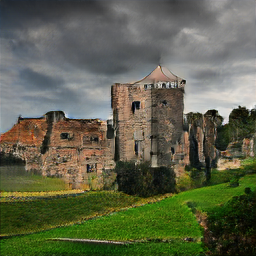

In [ ]:
imshow(imgs[0])

In [ ]:
min(num_amostras, 5)

5

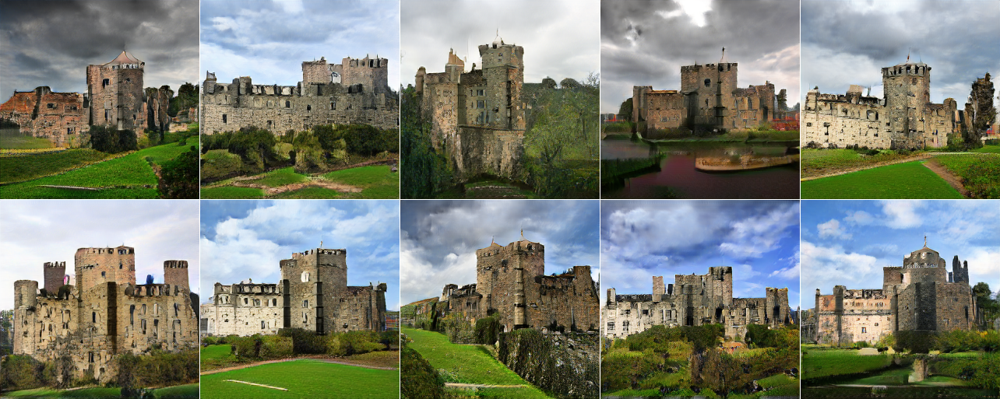

In [ ]:
imshow(imgrid(imgs, cols=min(num_amostras, 5)))

In [ ]:
def gerar_imagens_biggan(id_categ, num_amostras, truncation, seed_ruido):
  categoria = lista_categorias[id_categ]
  print('Categoria: {}'.format(categoria))
  z = truncated_z_sample(num_amostras, dim_z, truncation, seed_ruido)
  imgs = sample(sess, z, id_categ, vocab_size, input_z, input_y, input_trunc, output, truncation=truncation)
  return imgs

Categoria: castle


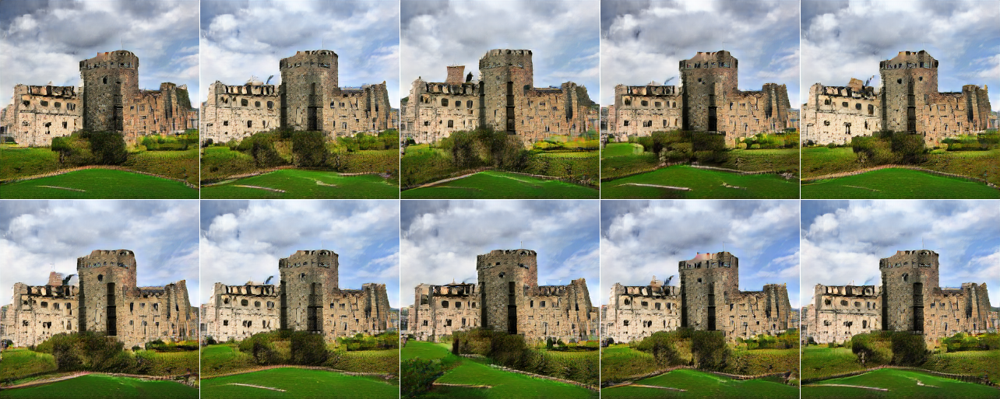

In [ ]:
truncation = 0.1
imgs = gerar_imagens_biggan(id_categ, num_amostras, truncation, seed_ruido)
imshow(imgrid(imgs, cols=min(num_amostras, 5)))

Categoria: castle


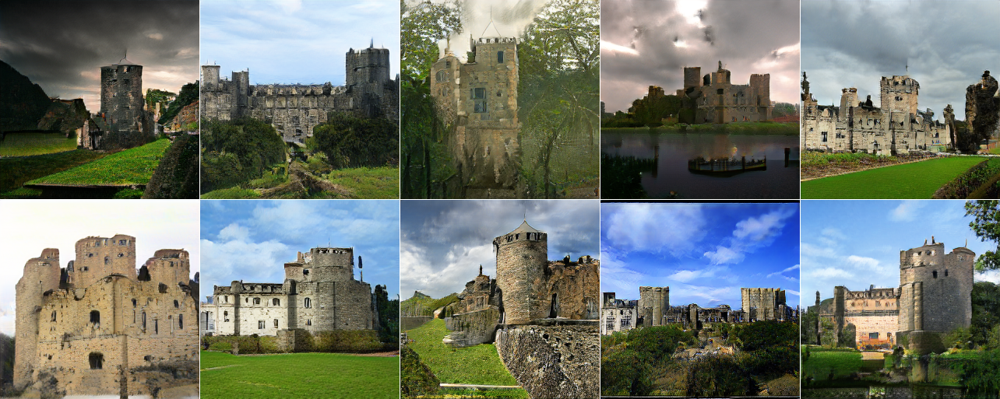

In [ ]:
truncation = 1.0
imgs = gerar_imagens_biggan(id_categ, num_amostras, truncation, seed_ruido)
imshow(imgrid(imgs, cols=min(num_amostras, 5)))

Categoria: cheeseburger


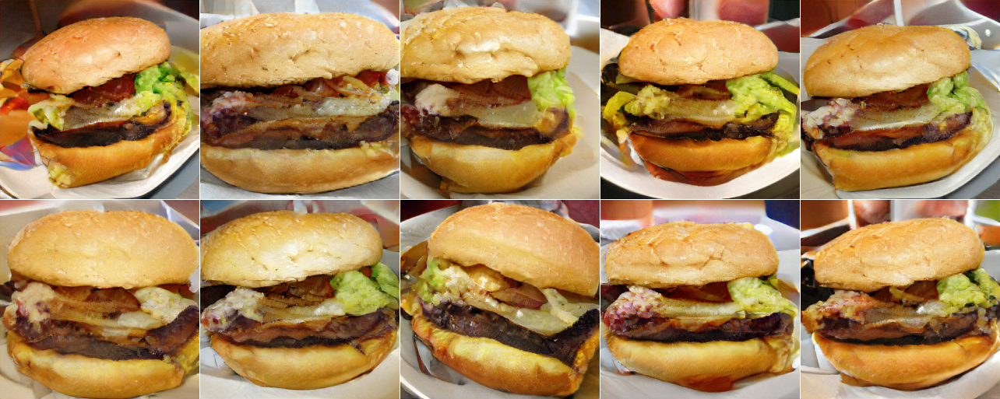

In [ ]:
id_categ = 933
truncation = 0.5
imgs = gerar_imagens_biggan(id_categ, num_amostras, truncation, seed_ruido)
imshow(imgrid(imgs, cols=min(num_amostras, 5)))

Categoria: Tibetan terrier, chrysanthemum dog


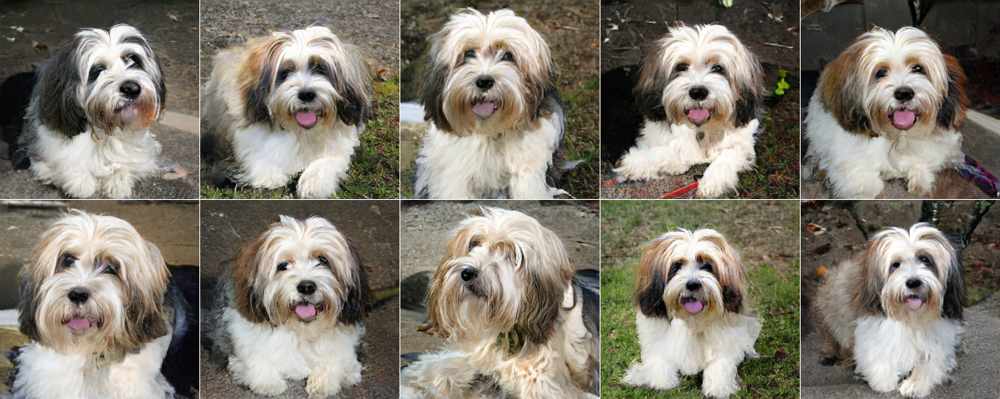

In [ ]:
id_categ = 200       #@param {type:"slider", min:0, max:999, step:1}
num_amostras = 10   #@param {type:"slider", min:1, max:20, step:1}
truncation = 0.3    #@param {type:"slider", min:0.02, max:1, step:0.02}
seed_ruido = 0  #@param {type:"slider", min:0, max:100000, step:1}

imgs = gerar_imagens_biggan(id_categ, num_amostras, truncation, seed_ruido)

imshow(imgrid(imgs, cols=min(num_amostras, 5)))

## Salvando os resultados

In [ ]:
for i, img in enumerate(imgs):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  cv2.imwrite("img_{}.jpg".format(i), img)

## Interpolação entre amostras

Sugestões de teste:
* Defina diferentes categorias mantendo mesmo valor de seed para elas.
* Defina diferentes valores de seed para a mesma categoria.
* Ou, defina diferentes valores para ambos os parâmetros e veja no que vai dar.

In [ ]:
def interpolar_amostras(A, B, num_interps):
  interps = interpolate(A, B, num_interps)
  return (interps.transpose(1, 0, *range(2, len(interps.shape)))
                 .reshape(num_amostras_int * num_interps, *interps.shape[2:]))

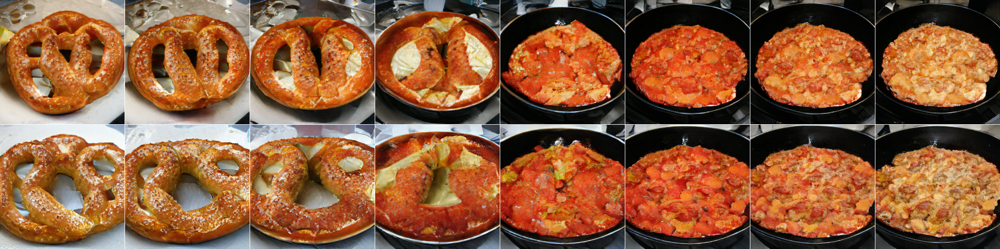

In [ ]:
num_amostras_int = 2
num_interps = 8        #@param {type:"slider", min:0, max:20, step:1}
truncation_int = 0.5   #@param {type:"slider", min:0.02, max:1, step:0.02}

seed_ruido_A = 0       #@param {type:"slider", min:0, max:100000, step:1}
categoria_A = 932      #@param {type:"slider", min:0, max:999, step:1}

seed_ruido_B = 0       #@param {type:"slider", min:0, max:100000, step:1}
categoria_B = 567      #@param {type:"slider", min:0, max:999, step:1}


z_A, z_B = [truncated_z_sample(num_amostras_int, dim_z, truncation, noise_seed)
            for noise_seed in [seed_ruido_A, seed_ruido_B]]
y_A, y_B = [one_hot([categoria] * num_amostras_int, vocab_size)
            for categoria in [categoria_A, categoria_B]]

z_interp = interpolar_amostras(z_A, z_B, num_interps)
y_interp = interpolar_amostras(y_A, y_B, num_interps)

ims = sample(sess, z_interp, y_interp, vocab_size, input_z, input_y, input_trunc, output, truncation=truncation_int)
imshow(imgrid(ims, cols=num_interps))

---


Baseado no código:
* https://www.tensorflow.org/hub/tutorials/biggan_generation_with_tf_hub